# check and validate

routines to check the output of Bias_Correct_2_Livneh procedure

In [1]:
import xarray as xr
import numpy as np 
import pandas as pd
import glob, os
import matplotlib.pyplot as plt
import seaborn as sns

# import quantile_mapping # from same folder.
import multiprocessing
import itertools
import time

### CMIP5


In [33]:
path_bc="/glade/campaign/ral/hap/bert/CMIP5/WUS_icar_livBC4"
# models = ["CanESM5", "CMCC-CM2-SR5", "MIROC-ES2L", "MPI-M.MPI-ESM1-2-LR", "NorESM2-MM"] 
models = ['CanESM2', 'CCSM4','CMCC-CM', 'CNRM-CM5','MIROC5', 'MRI-CGCM3']  # GFDL-CM3
    
scenarios = ["rcp45", "rcp85"]

In [32]:
dt='3hr'
f"{path_bc}/{model}_{scen}/{dt}/icar_3hr_livgrid_{model}_{scen}_*.nc"

'/glade/campaign/ral/hap/bert/CMIP5/WUS_icar_livBC4/MPI-M.MPI-ESM1-2-LR_ssp585/3hr/icar_3hr_livgrid_MPI-M.MPI-ESM1-2-LR_ssp585_*.nc'

### CMIP6

In [3]:
# path_bc="/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_livBC3"
path_nobc="/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3"
# path_bc="/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_livBC4"

models = ["CanESM5", "CMCC-CM2-SR5", "MIROC-ES2L", "MPI-M.MPI-ESM1-2-LR", "NorESM2-MM"] 
# scenarios = ["ssp245_2004", "ssp245_2049", "ssp370_2004", "ssp370_2049", "ssp585_2004", "ssp585_2049"]
scenarios = ["ssp245", "ssp370", "ssp585"]


path_nobc="/glade/campaign/ral/hap/bert/CMIP6/greatlakes/GL_livgrid_rh2m"
path_bc="/glade/campaign/ral/hap/bert/CMIP6/greatlakes/GL_livBC"
models = [ "MIROC-ES2L", ] 
# scenarios = ["ssp245_2004", "ssp245_2049", "ssp370_2004", "ssp370_2049", "ssp585_2004", "ssp585_2049"]
scenarios = [ "ssp370", "ssp585"]


### CESM2 ensemble

In [ ]:
path_bc="/glade/campaign/ral/hap/bert/CESM2/livneh/regrid_input/cesm2-le.010.hist_ssp370/daily"
models = ["CanESM5", "CMCC-CM2-SR5", "MIROC-ES2L", "MPI-M.MPI-ESM1-2-LR", "NorESM2-MM"] 
# scenarios = ["ssp245_2004", "ssp245_2049", "ssp370_2004", "ssp370_2049", "ssp585_2004", "ssp585_2049"]
scenarios = ["ssp245", "ssp370", "ssp585"]

### functions

In [4]:
def check_output_nans( model, scen, var='rsds', path=path_bc, dt='3hr'):
    """  """
    # for model in models:
    #     for scen in scenarios:
    if dt is None:
        files=sorted(glob.glob(f"{path}/{model}_{scen}/icar_3hr_livgrid_{model}_{scen}_*.nc"))
    elif "derecho" in path: # input
        scen1=scen.split("_")[0]
        print(f"  scenario from {scen} to {scen1} " )
        print(f"{path}/{model}_{scen}/icar_*_{model}_{scen1}_*.nc")
        files=sorted(glob.glob(f"{path}/{model}_{scen}/icar_*_{model}_{scen1}_*.nc"))
    else:
        files=sorted(glob.glob(f"{path}/{model}_{scen}/{dt}/icar_3hr_livgrid_{model}_{scen}_*.nc"))
    
    print(f"\n checking {model} {scen} {len(files)} files")        
    for f in files:
        dsl = xr.open_dataset( f )
        for t in range(len(dsl.time)):

            cnt = np.count_nonzero(np.isnan(dsl[var].isel(time=t).values))
            if t==0:
                cnt0 = cnt
            else:
                if  cnt>cnt0: print(f" {model} {scen}:  {dsl.time.isel(time=t).values} has NaNs in {var} ")
                
    print(f" - - {model} done - -")        

In [5]:
def check_missing_time( model, scen, path=path_bc, dt=None):
    """Check for missing timesteps"""

    if dt is not None:
        files  = sorted(glob.glob( f"{path}/{model}_{scen}/{dt}/icar_*"))
    else:
        files  = sorted(glob.glob( f"{path}/{model}_{scen}/icar_*"))

    print(f"\n checking {model} {scen} {len(files)} files")        
    for i in range(len(files)):
        f = files[i:i+2]  # open 2 files so we catch missing data at the end of a month
        
        ds5 = xr.open_mfdataset( f )
    
        idx = np.where(ds5.time.diff(dim='time').values > ds5.time.diff(dim='time').min().values )
        
        if len(idx[0])==1:
            print( #f.split('/')[-1], idx[0],
                  model, scen, ds5.time.values[ idx[0][0] ] 
                 )
        elif len(idx[0])>1:
            for l in len(idx[0]):
                print( 
                      model, scen, ds5.time.values[ idx[0][l] ] 
                     )
            

In [6]:
def check_Tmin_max( model, scen, path_bc, dt='daily'):
    """ check if Tmin is larger than Tmax (daily files only)"""
    
    if dt is not None:
        files  = sorted(glob.glob( f"{path}_{model}/{scen}/{dt}/icar_*"))
    else:
        files  = sorted(glob.glob( f"{path}_{model}/{scen}/icar_*"))

    print(f"\n checking {model} {scen} {len(files)} files")        
    for i in range(len(files)):
        f = files[i:i+2]  # open 2 files so we catch missing data at the end of a month
        
        ds5 = xr.open_mfdataset( f )
    
        cnt =  np.sum( ds5.Tmin.values > ds5.Tmax.values ) 
        print(model, scen, cnt)
        
        if cnt > 0: # if len(cnt[0]) > 0:
            idx = np.where( ds5.Tmin.values > ds5.Tmax.values )
            # print(f" Tmin> Tmax @ {ds5.time[idx[0][0] }")
            
            if len(idx[0])==1:
                print( #f.split('/')[-1], idx[0],
                      model, scen, ds5.time.values[ idx[0][0] ] 
                     )
            elif len(idx[0])>1:
                for l in len(idx[0]):
                    print( 
                          model, scen, ds5.time.values[ idx[0][l] ] 
                         )
            

In [7]:
def check_ta2m_low( model, scen, path=path_bc, dt='3hr'):
    """ check for excessively low temperatures."""


    
    var='ta2m'
    
    files=sorted(glob.glob(f"{path}/{model}_{scen}/3hr/icar_3hr_livgrid_{model}_{scen}_*.nc"))
    print(f"  {model} {scen}: checking {len(files)} files ...")        

    for f in files:
        dsl = xr.open_dataset( f )

        if(dsl.ta2m.min(dim='time').values <100).any():
            print(f" {f} has low temps!")
            
            
    print(f" - - {model} {scen} done - -")        

In [8]:
def plot_pcp_ts(model, scen, path=path_bc, dt='3hr',lat_idx=150, lon_idx=150):
    """ Plot timeseries of precipitation, annual sums """
    
    if dt=='3hr':  pcp_var='precip_dt'
    elif dt=='daily':  pcp_var='Prec'
    scen1=scen.split("_")[0]
    
    files=sorted(glob.glob(f"{path}/{model}_{scen}/{dt}/icar_*_{model}_{scen1}_*.nc"))
    # print(f"  {model} {scen}: checking {len(files)} files ...")   

    fig, ax = plt.subplots( 1, 2, figsize=(14,7))

    for i,f in enumerate(files):
        ds=xr.open_dataset(f) 

        ax[0].plot( ds.time, ds[pcp_var].isel(lat=lat_idx).isel(lon=lon_idx) ) 
        # ax[0].plot(ds.time, ds[pcp_var].isel(lat=lat_idx).isel(lon=lon_idx) ) 
        ax[0].set_title( f.split('/')[-1].split('livgrid_')[-1] , fontsize=10)

        pcp_ann=ds[pcp_var].isel(lat=lat_idx).isel(lon=lon_idx).resample(time='1Y').sum()
        ax[1].plot(pcp_ann.time, pcp_ann ) 
        ax[1].set_title( "annual sum" , fontsize=10)
        
    fig.suptitle(f" {pcp_var} at j,i = {lat_idx} {lon_idx}  ")
    plt.show()

In [9]:
def plot_ta2m_ts(model, scen, path=path_bc, dt='3hr', lat_idx=150, lon_idx=150):
    """ Plot timeseries of ta2m, annual max and min """

    if dt=='3hr':  tvar='ta2m'
    elif dt=='daily':  tvar='Tmax'

    
    files=sorted(glob.glob(f"{path}/{model}_{scen}/3hr/icar_3hr_livgrid_{model}_{scen}_*.nc"))
    

    fig, ax = plt.subplots( 1, 3, figsize=(16,6))

    for i,f in enumerate(files):
        ds=xr.open_dataset(f) 

        ax[0].plot(ds.time, ds[tvar].isel(lat=lat_idx).isel(lon=lon_idx) ) 
        ax[0].set_title( f.split('/')[-1].split('livgrid_')[-1] , fontsize=10)

        tmax_ann=ds[tvar].isel(lat=lat_idx).isel(lon=lon_idx).resample(time='1Y').max()
        ax[1].plot(tmax_ann.time, tmax_ann ) 
        ax[1].set_title( "annual maximum" , fontsize=10)

        tmin_ann=ds[tvar].isel(lat=lat_idx).isel(lon=lon_idx).resample(time='1Y').min()
        ax[2].plot(tmin_ann.time, tmin_ann ) 
        ax[2].set_title( "annual minimum" , fontsize=10)

        
    fig.suptitle(f" {tvar} at j,i = {lat_idx} {lon_idx}  ")
    plt.show()

## Run some Checks

### 1 model

In [ ]:
model="MIROC-ES2L" ; scen="ssp370"

check_output_nans( model, scen, var='precip_dt', path=path_bc, dt='3hr')


 checking MIROC-ES2L ssp370 17 files


In [17]:
model="MIROC-ES2L" ; scen="ssp245_2049"

check_output_nans( model, scen,  path=path_nobc, dt='daily')

  scenario from ssp245_2049 to ssp245 
/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3/MIROC-ES2L_ssp245_2049/icar_*_MIROC-ES2L_ssp245_*.nc

 checking MIROC-ES2L ssp245_2049 0 files
 - - MIROC-ES2L done - -


In [12]:
model="MIROC-ES2L" ; scen="ssp370"

check_output_nans( model, scen, var='precip_dt', path=path_bc, dt='3hr')


 checking MIROC-ES2L ssp370 17 files
 MIROC-ES2L ssp370:  2099-12-30T18:00:00.000000000 has NaNs in precip_dt 
 MIROC-ES2L ssp370:  2099-12-30T21:00:00.000000000 has NaNs in precip_dt 
 - - MIROC-ES2L done - -


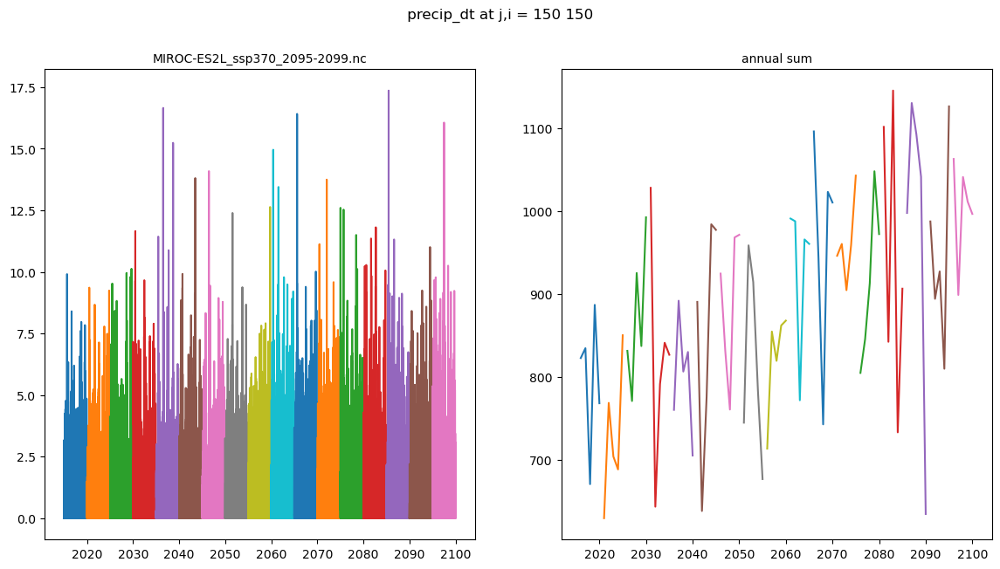

In [13]:
plot_pcp_ts(model, scen, path=path_bc, dt='3hr',lat_idx=150, lon_idx=150)

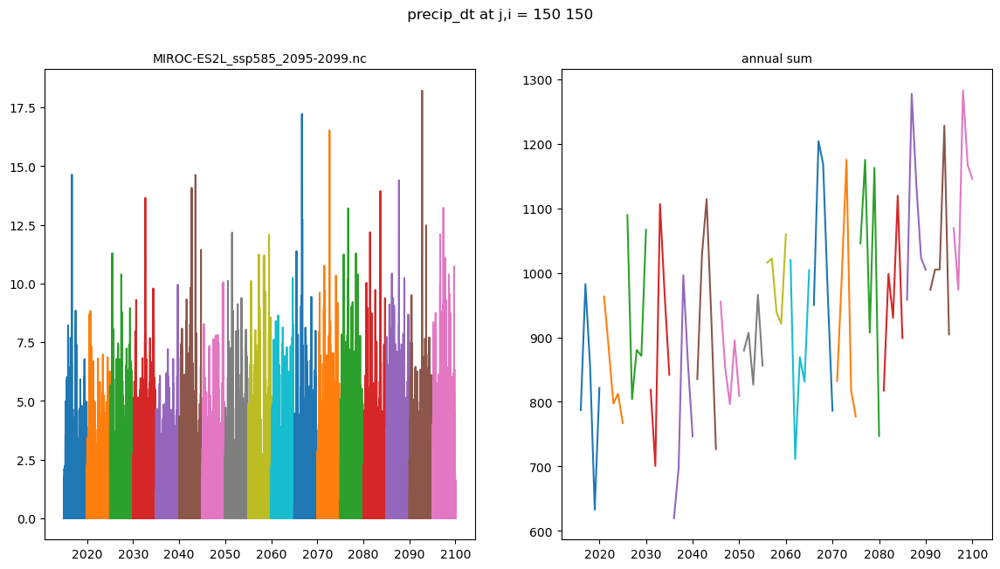

In [17]:
plot_pcp_ts(model, scen="ssp585", 
            # path="/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3", # /MIROC-ES2L_ssp245_2049/daily
            # path="/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_livBC5",
            path="/glade/campaign/ral/hap/bert/CMIP6/greatlakes/GL_livBC",
            dt='3hr',lat_idx=100, lon_idx=100)

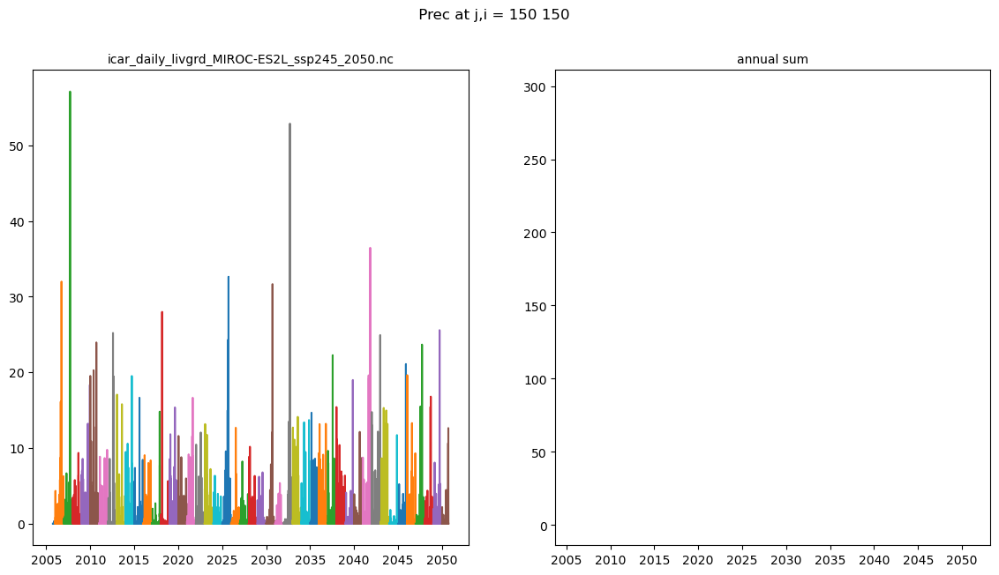

In [76]:
plot_pcp_ts(model, scen="ssp245_2004", 
            path="/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3", # /MIROC-ES2L_ssp245_2049/daily
            dt='daily',lat_idx=150, lon_idx=150)

### Check for NaNs

In [ ]:

with multiprocessing.Pool(processes=len(models)*len(scenarios)) as pool:
    results = pool.starmap(check_output_nans, list(itertools.product(models, scenarios)))



 checking MIROC-ES2L ssp370 17 files

 checking MIROC-ES2L ssp585 17 files


### Check for missing timesteps

In [15]:

with multiprocessing.Pool(processes=len(models)*len(scenarios)) as pool:
    results = pool.starmap(check_missing_time, list(itertools.product(models, scenarios)))



 checking MIROC-ES2L ssp585 0 files
 checking MIROC-ES2L ssp370 0 files



### Check for Tmin > Tmax (daily files)

In [ ]:

with multiprocessing.Pool(processes=len(models)*len(scenarios)) as pool:
    results = pool.starmap(check_Tmin_max, list(itertools.product(models, scenarios)))

### Check for low ta2m values (3hr)

In [10]:

t0=time.time()
with multiprocessing.Pool(processes=len(models)*len(scenarios)) as pool:
    results = pool.starmap(check_ta2m_low, list(itertools.product(models, scenarios)))

print(time.time()-t0)

  MIROC-ES2L ssp370: checking 17 files ...  MIROC-ES2L ssp585: checking 17 files ...  CMCC-CM2-SR5 ssp245: checking 17 files ...  MPI-M.MPI-ESM1-2-LR ssp370: checking 17 files ...  CMCC-CM2-SR5 ssp370: checking 17 files ...  MPI-M.MPI-ESM1-2-LR ssp245: checking 17 files ...  CMCC-CM2-SR5 ssp585: checking 17 files ...  NorESM2-MM ssp370: checking 17 files ...  MIROC-ES2L ssp245: checking 17 files ...  CanESM5 ssp370: checking 17 files ...  CanESM5 ssp245: checking 17 files ...  CanESM5 ssp585: checking 17 files ...  NorESM2-MM ssp585: checking 17 files ...  MPI-M.MPI-ESM1-2-LR ssp585: checking 17 files ...











  NorESM2-MM ssp245: checking 17 files ...




KeyboardInterrupt: 

## Plots

### Plot timeseries of random gridpoints

In [ ]:
ds.time.dt.calendar=='noleap'

In [15]:
# model=models[0] ; scen=scenarios[0]
model="MIROC-ES2L" ; scen="ssp245"


In [16]:
scen

'ssp245'

2015-01-01T00:00:00.000000000 2019-12-31T21:00:00.000000000 2015-01-01T00:00:00.000000000 2019-12-31T21:00:00.000000000
2020-01-01T00:00:00.000000000 2024-12-31T21:00:00.000000000 2020-01-01T00:00:00.000000000 2024-12-31T21:00:00.000000000


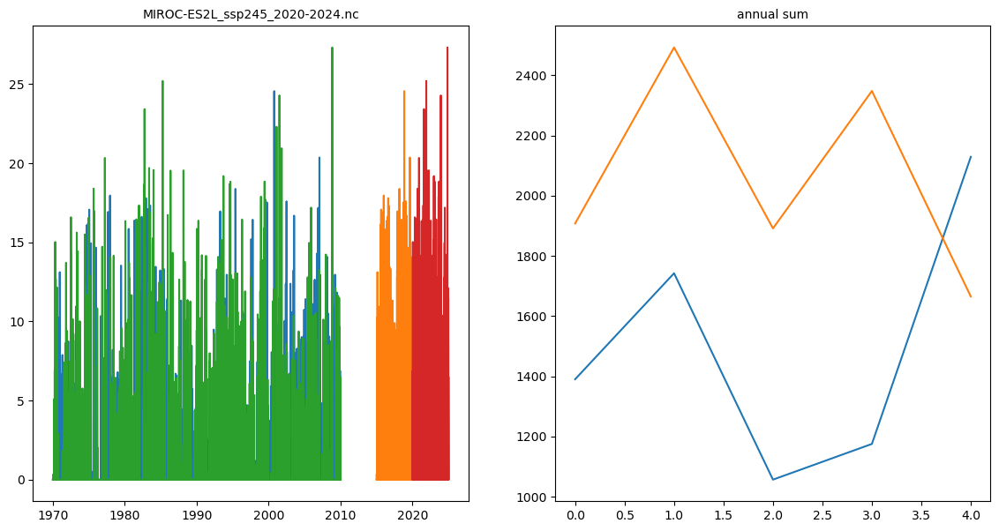

In [17]:
import cftime
path=path_bc; pcp_var='precip_dt'; lat_idx=150; lon_idx=150

files=sorted(glob.glob(f"{path}/{model}_{scen}/3hr/icar_3hr_livgrid_{model}_{scen}_*.nc"))

fig, ax = plt.subplots( 1, 2, figsize=(14,7))

for i,f in enumerate(files[:2]):
    ds=xr.open_dataset(f) 

    if ds.time.dt.calendar=='noleap':
        # time_np = xr.coding.times.decode_cf(ds['time'])
        # time_np = pd.to_datetime(ds.time.values)
        # time_np = ds.time.dt.to_pandas()
        time_np = ds.time.astype('datetime64[h]')
    else:
        time_np = ds.time
    print( ds.time.min().values, ds.time.max().values, min(time_np.values), max(time_np.values)) 

    ax[0].plot( ds[pcp_var].isel(lat=lat_idx).isel(lon=lon_idx) ) 
    ax[0].plot(time_np, ds[pcp_var].isel(lat=lat_idx).isel(lon=lon_idx) ) 
    ax[0].set_title( f.split('/')[-1].split('livgrid_')[-1] , fontsize=10)

    pcp_ann=ds[pcp_var].isel(lat=lat_idx).isel(lon=lon_idx).resample(time='1Y').sum()
    ax[1].plot( pcp_ann ) 
    ax[1].set_title( "annual sum" , fontsize=10)

In [ ]:

model = "MPI-M.MPI-ESM1-2-LR"
scen  = "ssp585"
# model = "CCSM4"
# scen  = "rcp85"

model = models[0]
scen = scenarios[0]

## precip at 150, 150:
plot_pcp_ts(model, scen, path=path_bc, dt='3hr',lat_idx=150, lon_idx=150)


## temperature @ 150,150
plot_ta2m_ts(model, scen, path=path_bc, dt='3hr',lat_idx=150, lon_idx=150)


### Plot maps of 5year max pcp

In [35]:

def plot_pcpmax(model, scen, path=path_bc, dt='3hr'):
    if dt=='3hr':  pcp_var='precip_dt'
    elif dt=='daily':  pcp_var='Prec'
    
    files=sorted(glob.glob(f"{path}/{model}_{scen}/3hr/icar_3hr_livgrid_{model}_{scen}_*.nc"))
    # print(f"  {model} {scen}: checking {len(files)} files ...")   

    fig, ax = plt.subplots( 5, 4, figsize=(15,12))

    for i,f in enumerate(files[11:]):
        ds=xr.open_dataset(f) 
        print(i, f.split("icar_3hr_livgrid_")[-1] )
        pcpmax = ds[pcp_var].max(dim='time').compute()
        ax.flatten()[i].pcolormesh( pcpmax, cmap='turbo', vmax=100 ) 
        # cbar1 = fig.colorbar(p1, ax=ax.flatten()[i])
        ax.flatten()[i].set_title( f.split('/')[-1].split('livgrid_')[-1] , fontsize=10)
        
    fig.suptitle(" max 3hr pcp amount ")
    plt.show()

In [13]:

def plot_pcpmean(model, scen, path=path_bc, dt='3hr'):
    if dt=='3hr':  pcp_var='precip_dt'
    elif dt=='daily':  pcp_var='Prec'
    
    files=sorted(glob.glob(f"{path}/{model}_{scen}/3hr/icar_3hr_livgrid_{model}_{scen}_*.nc"))
    # print(f"  {model} {scen}: checking {len(files)} files ...")   

    fig, ax = plt.subplots( 5, 4, figsize=(15,12))

    for i,f in enumerate(files):
        ds=xr.open_dataset(f) 
        print(i, f.split("icar_3hr_livgrid_")[-1] )
        
        p1 = ax.flatten()[i].pcolormesh( ds[pcp_var].mean(dim='time'), cmap='turbo', ) 
        cbar1 = fig.colorbar(p1, ax=ax.flatten()[i])
        ax.flatten()[i].set_title( f.split('/')[-1].split('livgrid_')[-1] , fontsize=10)
        
    fig.suptitle(" mean 3hr pcp amount ")
    plt.show()

In [ ]:
# model = models[1]
# scen = scenarios[0]

model="MIROC-ES2L" ; scen="ssp245"
print(path_bc)

t0 = time.time()

plot_pcpmax(model, scen, path=path_bc, dt='3hr')

print(time.time()-t0)

0 MIROC-ES2L_ssp245_2070-2074.nc 125.991554
1 MIROC-ES2L_ssp245_2075-2079.nc 134.27258
2 MIROC-ES2L_ssp245_2080-2084.nc 135.16049
3 MIROC-ES2L_ssp245_2085-2089.nc 153.73033
4 MIROC-ES2L_ssp245_2090-2094.nc 140.10733
5 MIROC-ES2L_ssp245_2095-2099.nc 142.04108


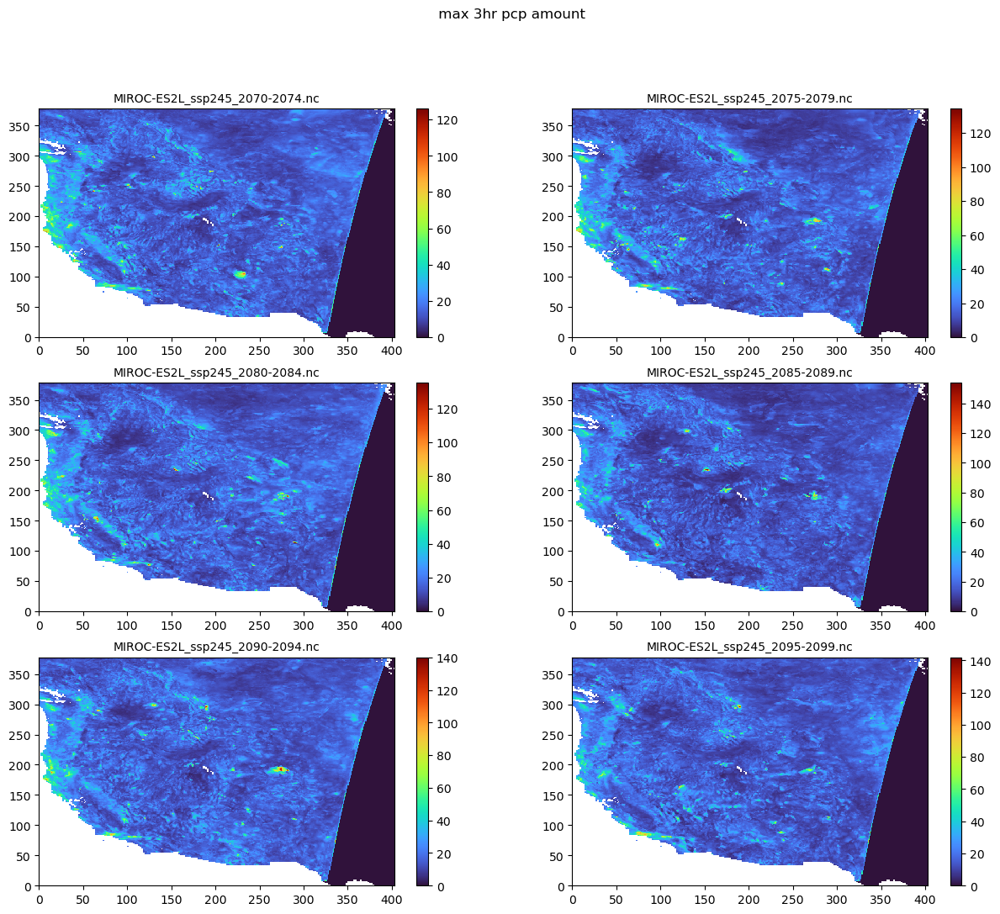

In [16]:
    path_bc="/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_livBC5"
    pcp_var='precip_dt'
    files=sorted(glob.glob(f"{path_bc}/{model}_{scen}/3hr_pcp/icar_3hr_livgrid_{model}_{scen}_*.nc"))
    # print(f"  {model} {scen}: checking {len(files)} files ...")   

    fig, ax = plt.subplots( 3, 2, figsize=(15,12))

    for i,f in enumerate(files[11:]):
        ds=xr.open_dataset(f) 
        
        pcpmax=ds[pcp_var].max(dim='time').compute()
        print(i, f.split("icar_3hr_livgrid_")[-1] , np.nanmax(pcpmax.values) )
        
        p1 = ax.flatten()[i].pcolormesh( pcpmax, cmap='turbo', ) 
        cbar1 = fig.colorbar(p1, ax=ax.flatten()[i])
        ax.flatten()[i].set_title( f.split('/')[-1].split('livgrid_')[-1] , fontsize=10)
        
    fig.suptitle(" max 3hr pcp amount ")
    plt.show()

0 MIROC-ES2L_ssp245_2070-10.nc 42.30642
1 MIROC-ES2L_ssp245_2070-11.nc 43.3923
2 MIROC-ES2L_ssp245_2070-12.nc 67.899826
3 MIROC-ES2L_ssp245_2071-01.nc 55.3782
4 MIROC-ES2L_ssp245_2071-02.nc 54.95002
5 MIROC-ES2L_ssp245_2071-03.nc 46.535606
6 MIROC-ES2L_ssp245_2071-04.nc 26.424046
7 MIROC-ES2L_ssp245_2071-05.nc 22.431929
8 MIROC-ES2L_ssp245_2071-06.nc 21.175947
9 MIROC-ES2L_ssp245_2071-07.nc 27.255621
10 MIROC-ES2L_ssp245_2071-08.nc 19.558071
11 MIROC-ES2L_ssp245_2071-09.nc 31.627289
12 MIROC-ES2L_ssp245_2071-10.nc 51.266827
13 MIROC-ES2L_ssp245_2071-11.nc 39.604156
14 MIROC-ES2L_ssp245_2071-12.nc 40.47152
15 MIROC-ES2L_ssp245_2072-01.nc 44.440914
16 MIROC-ES2L_ssp245_2072-02.nc 43.82442
17 MIROC-ES2L_ssp245_2072-03.nc 30.808441
18 MIROC-ES2L_ssp245_2072-04.nc 41.47453
19 MIROC-ES2L_ssp245_2072-05.nc 23.58438
20 MIROC-ES2L_ssp245_2072-06.nc 18.293137
21 MIROC-ES2L_ssp245_2072-07.nc 22.429287
22 MIROC-ES2L_ssp245_2072-08.nc 22.670404
23 MIROC-ES2L_ssp245_2072-09.nc 23.697136
24 MIROC-ES2

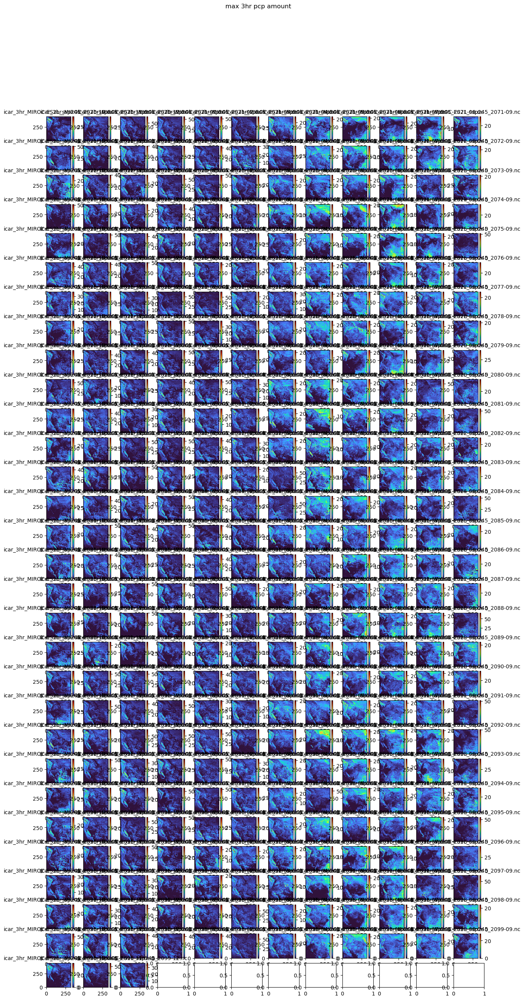

In [59]:
path_nobc="/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_nocp_full/MIROC-ES2L_ssp245_2049/3hr"

files= sorted(glob.glob(f"{path_nobc}/icar_3hr_{model}_*.nc"))
# print(files)
# print(f"  {model} {scen}: checking {len(files)} files ...")   

fig, ax = plt.subplots( 30, 12, figsize=(15,30))

for i,f in enumerate(files[20*12:]):
    ds=xr.open_dataset(f) 
    
    pcpmax=ds[pcp_var].max(dim='time').compute()
    # print(i, f.split("icar_3hr_")[-1], np.nanmax(pcpmax.values) )
    print( f.split("icar_3hr_")[-1], np.nanmax(pcpmax.values) )
    
#     p1 = ax.flatten()[i].pcolormesh( pcpmax, cmap='turbo', ) 
#     cbar1 = fig.colorbar(p1, ax=ax.flatten()[i])
#     ax.flatten()[i].set_title( f.split('/')[-1].split('livgrid_')[-1] , fontsize=10)
    
# fig.suptitle(" max 3hr pcp amount ")
# plt.show()

SyntaxError: invalid decimal literal (4271836079.py, line 3)

In [38]:
files=sorted(glob.glob(f"{path}/{model}_{scen}/3hr/icar_3hr_livgrid_{model}_{scen}_*.nc"))
for i,f in enumerate(files[-2:]):
    ds=xr.open_dataset(f) 
    print(i, f.split("icar_3hr_livgrid_")[-1] )
    idx = np.where(ds.precip_dt.values>200 )
    if len(idx[0])>0:
        for i in range(len(idx[0])):
            print( idx[0][i], ds.time[  idx[0][i] ].values , idx[1][i], idx[2][i], )

0 MIROC-ES2L_ssp245_2090-2094.nc
72 2090-01-10T00:00:00.000000000 174 8
184 2090-01-24T00:00:00.000000000 148 23
184 2090-01-24T00:00:00.000000000 174 8
242 2090-01-31T06:00:00.000000000 298 129
260 2090-02-02T12:00:00.000000000 185 275
260 2090-02-02T12:00:00.000000000 186 274
260 2090-02-02T12:00:00.000000000 186 275
260 2090-02-02T12:00:00.000000000 187 274
260 2090-02-02T12:00:00.000000000 187 276
260 2090-02-02T12:00:00.000000000 188 277
260 2090-02-02T12:00:00.000000000 189 276
260 2090-02-02T12:00:00.000000000 189 277
260 2090-02-02T12:00:00.000000000 190 274
260 2090-02-02T12:00:00.000000000 190 275
260 2090-02-02T12:00:00.000000000 191 274
260 2090-02-02T12:00:00.000000000 191 275
260 2090-02-02T12:00:00.000000000 191 276
260 2090-02-02T12:00:00.000000000 192 274
260 2090-02-02T12:00:00.000000000 192 275
261 2090-02-02T15:00:00.000000000 185 275
311 2090-02-08T21:00:00.000000000 148 23
311 2090-02-08T21:00:00.000000000 148 24
311 2090-02-08T21:00:00.000000000 149 23
311 2090-0

In [25]:
ds=xr.open_dataset(files[-1])
idx = np.where(ds.precip_dt.values>200 )
idx, len(idx[0] )

(array([8373]), array([295]), array([189]))

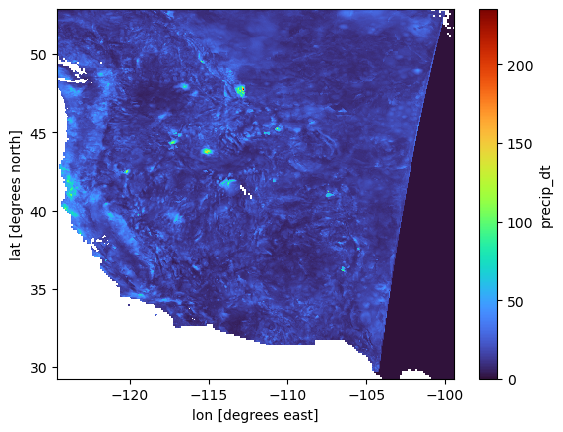

In [30]:
ds.precip_dt.max(dim='time').plot(cmap='turbo')

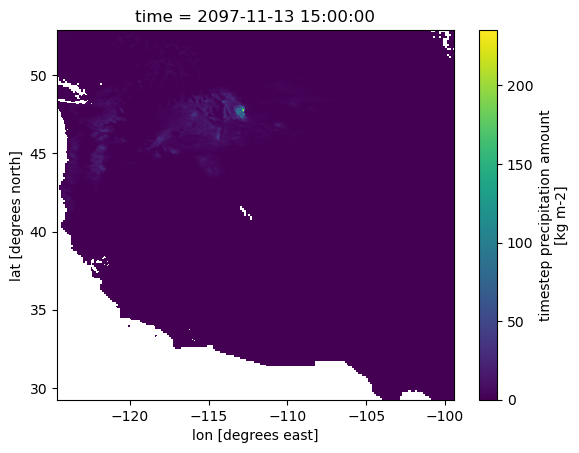

In [29]:
ds.precip_dt.isel(time=idx[0]).plot()

ValueError: x and y can be no greater than 2D, but have shapes (14599,) and (14599, 1, 1)

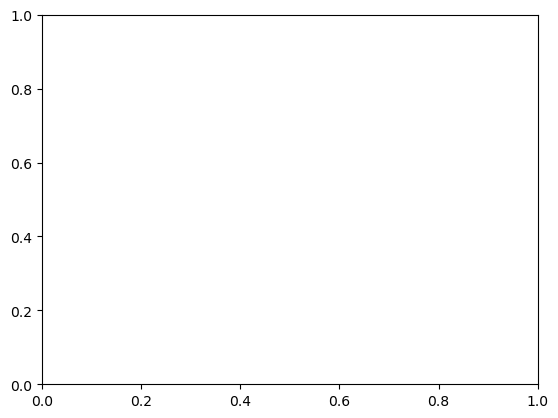

In [32]:
plt.plot( ds.time, ds.precip_dt[:, idx[1], idx[2] ] )

In [ ]:
t0 = time.time()

plot_pcpmean(model, scen, path=path_bc, dt='3hr')

print(time.time()-t0)

### Plot map of 5y Temperature max or min

In [74]:

def plot_Tmax(model, scen, path=path_bc, dt='3hr'):
    if dt=='3hr':  tvar='ta2m'
    elif dt=='daily':  tvar='Tmax'
    
    files=sorted(glob.glob(f"{path}/{model}_{scen}/{dt}/icar_3hr_livgrid_{model}_{scen}_*.nc"))
    
    fig, ax = plt.subplots( 5, 4, figsize=(15,12))

    for i,f in enumerate(files):
        ds=xr.open_dataset(f) 
        print(f"  {f.split('/')[-1]} Tmin: {ds.ta2m.min().values} , Tmax: {ds.ta2m.max().values} ")
        # print(f"  {f.split('/')[-1]} Tmax: {ds.ta2m.max().values} ")
        p1 = ax.flatten()[i].pcolormesh( ds[tvar].max(dim='time'), cmap='turbo') 
        cbar1 = fig.colorbar(p1, ax=ax.flatten()[i])
        ax.flatten()[i].set_title( f.split('/')[-1].split('livgrid_')[-1] , fontsize=10)

    fig.suptitle(f" Max {dt} {tvar} ")
    plt.show()

In [21]:
model = models[1]
scen = scenarios[0]

t0 = time.time()

plot_Tmax(model, scen, path=path_bc, dt='3hr')

print(time.time()-t0)

NameError: name 'plot_Tmax' is not defined

In [76]:

def plot_Tmin(model, scen, path=path_bc, dt='3hr'):
    if dt=='3hr':  tvar='ta2m'
    elif dt=='daily':  tvar='Tmax'
    
    files=sorted(glob.glob(f"{path}/{model}_{scen}/{dt}/icar_3hr_livgrid_{model}_{scen}_*.nc"))
    
    fig, ax = plt.subplots( 5, 4, figsize=(18,21))

    for i,f in enumerate(files):
        ds=xr.open_dataset(f) 
    print(f"  {f.split('/')[-1]} Tmin: {ds.ta2m.min().values}  ")
        p1 = ax.flatten()[i].pcolormesh( ds[tvar].min(dim='time'), cmap='turbo') 
        cbar1 = fig.colorbar(p1, ax=ax.flatten()[i])
        ax.flatten()[i].set_title( f.split('/')[-1].split('livgrid_')[-1] , fontsize=10)

    fig.suptitle(f" Min {dt} {tvar} ")
    plt.show()

IndentationError: unexpected indent (2208244546.py, line 12)

In [ ]:
# model = "MPI-M.MPI-ESM1-2-LR"
# scen  = "ssp585"

t0 = time.time()

plot_Tmin(model, scen, path=path_bc, dt='3hr')

print(time.time()-t0)

### Check input for NANs

In [ ]:
var='rsds'

path="/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3"
# models = ["CanESM5", "CMCC-CM2-SR5", "MIROC-ES2L", "MPI-M.MPI-ESM1-2-LR", "NorESM2-MM"] 
models = ["MPI-M.MPI-ESM1-2-LR", "NorESM2-MM"] 
scenarios=["ssp245_2004","ssp245_2049","ssp370_2004","ssp370_2049","ssp585_2004","ssp585_2049", "hist"]

for model in models:
    for scen in scenarios:
        print(f" - - {model} {scen} - -")        
        files=sorted(glob.glob(f"{path}/{model}_{scen}/3hr/icar_3hr_livgrd_{model}_{scen.split('_')[0]}_*.nc"))
        # print(files)
        for f in files:
            dsl = xr.open_dataset( f )
            for t in range(len(dsl.time)):
                # print(t)
                cnt = np.count_nonzero(np.isnan(dsl[var].isel(time=t).values))
                if t==0:
                    cnt0 = cnt
                else:
                    if  cnt>cnt0: print(f" {dsl.time.isel(time=t).values} ")
            
print(f" - - {model} done - -")        

 - - MPI-M.MPI-ESM1-2-LR ssp245_2004 - -
 2050-01-01T03:00:00.000000000 
 2050-01-01T06:00:00.000000000 
 2050-01-01T09:00:00.000000000 
 2050-01-01T12:00:00.000000000 
 2050-01-01T15:00:00.000000000 
 2050-01-01T18:00:00.000000000 
 2050-01-01T21:00:00.000000000 
 - - MPI-M.MPI-ESM1-2-LR ssp245_2049 - -
 - - MPI-M.MPI-ESM1-2-LR ssp370_2004 - -
 - - MPI-M.MPI-ESM1-2-LR ssp370_2049 - -
 - - MPI-M.MPI-ESM1-2-LR ssp585_2004 - -
 - - MPI-M.MPI-ESM1-2-LR ssp585_2049 - -
 - - MPI-M.MPI-ESM1-2-LR hist - -
 - - NorESM2-MM ssp245_2004 - -
 - - NorESM2-MM ssp245_2049 - -


In [3]:
# tmask:
tmask=xr.open_dataset("/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_livBC3/Tmask.nc")
Tmask=tmask.__xarray_dataarray_variable__

In [4]:
def round_down_to_nearest_5(year):
    return (year // 5) * 5

In [5]:
model="MPI-M.MPI-ESM1-2-LR"
scen="ssp585_2049"
year=2066
year5=round_down_to_nearest_5(year)

In [6]:
# dsin=xr.open_mfdataset(
#     f"/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3/{model}_{scen}/3hr/icar_3hr_livgrd_{model}_{scen.split('_')[0]}_{str(year)}-*.nc"
# )

dsin5y=xr.open_mfdataset(
    # f"/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3/{model}_{scen}/3hr/icar_3hr_livgrd_{model}_{scen.split('_')[0]}_{str(year5)}-{str(year5+4)}.nc"
    f"/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3/{model}_{scen}/3hr/icar_3hr_livgrd_{model}_{scen.split('_')[0]}_206[5-9]-*.nc"
)

dsref=xr.open_mfdataset( # approximately, hist only
    f"/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3/{model}_hist/3hr/icar_3hr_livgrd_{model}_hist_*.nc"
)

In [10]:
dsr=xr.open_mfdataset(
    # "/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_3hr_month/{model}_{scen.split('_')[0]}_2004/icar_3hr_{model}_{scen.split('_')[0]}_2050-01.nc"
    f"/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_3hr_month/{model}_{scen}/icar_3hr_{model}_{scen.split('_')[0]}_{year}-*.nc"
   )

In [11]:
dspp=xr.open_mfdataset(
    f"/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_nocp_full/{model}_{scen}/3hr/icar_3hr_{model}_{scen.split('_')[0]}_{str(year)}-*.nc"
    # "/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3/{model}_{scen.split('_')[0]}_2004/3hr/icar_3hr_livgrd_{model}_{scen.split('_')[0]}_2050-01.nc"
    # "/glade/derecho/scratch/bkruyt/CMIP6/WUS_icar_LivGrd3/{model}_{scen.split('_')[0]}_2004/3hr/icar_3hr_livgrd_{model}__{scen.split('_')[0]}_2050-01.nc"
)

In [13]:
dsout=xr.open_dataset(
    f"/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_livBC3/{model}_{scen.split('_')[0]}/3hr/icar_3hr_livgrid_{model}_{scen.split('_')[0]}_{str(year5)}-{str(year5+4)}.nc"
)
dsout2=xr.open_dataset(
    f"/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_livBC4/{model}_{scen.split('_')[0]}/3hr/icar_3hr_livgrid_{model}_{scen.split('_')[0]}_{str(year5)}-{str(year5+4)}.nc"
)

In [ ]:
# np.where(dsin.ta2m.isel(lon=slice(None, -105)).values==0.)
np.nanmin(dsin.ta2m.isel(lon=slice(None, -104)) )

### Livneh Temperature [degC]

In [7]:
import warnings
# from pandas.errors import SerializationWarning  # Adjust based on the source of your warning

# Suppress SerializationWarning
warnings.filterwarnings("ignore") #, category=SerializationWarning)


In [8]:
tfiles = glob.glob("/glade/campaign/ral/hap/common/Livneh_met_updated/temp_and_wind/livneh_lusu_2020_temp_and_wind.2021-05-02.19[5-9]*.nc")
tfiles.extend(glob.glob("/glade/campaign/ral/hap/common/Livneh_met_updated/temp_and_wind/livneh_lusu_2020_temp_and_wind.2021-05-02.20*.nc"))
tfiles.sort()
print('   ',len(tfiles), " Livneh temperature files(years)" ) # the number of files (years)

livneht = xr.open_mfdataset(tfiles,parallel=True)

    69  Livneh temperature files(years)


In [9]:
icar_1file=dsin5y.isel(time=0)

In [10]:
# # # crop livneh to ICAR bounds:
max_lat=icar_1file.lat.max().values#+buff
min_lat=icar_1file.lat.min().values#-buff
max_lon=icar_1file.lon.max().values#+buff
min_lon=icar_1file.lon.min().values#-buff

LatIndexer, LonIndexer = 'lat', 'lon'

livneht = livneht.sel(**{LatIndexer: slice(min_lat, max_lat ),
                        LonIndexer: slice(min_lon, max_lon)})



### Bias corr for small subset

In [11]:
####################################
a=252; b=314

# input
ta2m = dsin5y["ta2m"][:,a-2:a+2, b-2:b+2]
tmin = ta2m.resample(time='1D').min(dim='time').load()
tmax = ta2m.resample(time='1D').max(dim='time').load()

# liv
livneh_tmin = livneht["Tmin"][:,a-2:a+2, b-2:b+2].load() # + 273.15    #.load()
livneh_tmax = livneht["Tmax"][:,a-2:a+2, b-2:b+2].load() # + 273.15    #.load()

# Ref
dsTmin_ref = dsref.ta2m[:,a-2:a+2, b-2:b+2].resample(time='1D').min(dim='time').load()
dsTmax_ref = dsref.ta2m[:,a-2:a+2, b-2:b+2].resample(time='1D').max(dim='time').load()

In [27]:
idx = np.where(dsin5y.time.diff(dim='time').values> dsin5y.time.diff(dim='time').min().values )
print( dsin5y.time.values[idx[0][0]-2: idx[0][0]+2 ] )
print( dsin5y.time.values[idx[0][1]-2: idx[0][1]+2 ] )

['2065-04-30T12:00:00.000000000' '2065-04-30T15:00:00.000000000'
 '2065-04-30T18:00:00.000000000' '2065-05-01T00:00:00.000000000']
['2065-09-20T15:00:00.000000000' '2065-09-20T18:00:00.000000000'
 '2065-09-20T21:00:00.000000000' '2065-09-24T00:00:00.000000000']


In [12]:
%%time
# qmap
print("   quantile mapping t_min")
bc_tmin = quantile_mapping.quantile_mapping_by_group(
     tmin, dsTmin_ref, livneh_tmin, detrend=False, extrapolate="1to1", grouper='time.month' , n_endpoints=50
    )

   quantile mapping t_min
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_end

In [13]:
%%time
print("   quantile mapping t_max")
bc_tmax = quantile_mapping.quantile_mapping_by_group(
    tmax, dsTmax_ref, livneh_tmax,   detrend=False, extrapolate="1to1", grouper='time.month' , n_endpoints=50
    )

   quantile mapping t_max
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_endpoints': 50}
putting the trend back
kwargs: {'alpha': 0.4, 'beta': 0.4, 'extrapolate': '1to1', 'n_end

In [ ]:
print(f"   min input ta2m: {np.nanmin(ta2m.values )}  (K)")
print(f"   min daily bc tmin: {np.nanmin(bc_tmin.values )} (C)")
print(f"   max daily bc tmax: {np.nanmax(bc_tmax.values )} (C)")



# - - - - - apply correction to n-hr data  - - - -
t0 = time.time()
print("   applying correction to "+str(tdelta_int)+"-hourly data")

for i in range(len(ta2m.time)):
    t = int(i/(24/tdelta_int))

    dtr = (tmax[t] - tmin[t]).values
    dtr[dtr<0.001] = 0.001
    if dtr<0 : print( f"   dtr: {dtr}")
        
    # this_ds["ta2m"][i] -= tmin[t]
    # this_ds["ta2m"][i] /= dtr
    # this_ds["ta2m"][i] *= np.abs(bc_tmax[t] - bc_tmin[t])
    # this_ds["ta2m"][i] += bc_tmin[t]+273.15
    
    ta2m[i] -= tmin[t]
    if ta2m[i].any()<0 :
        print(f"   ta2m[i] -= tmin[t]: {ta2m[i]}")
    ta2m[i] /= dtr
    if ta2m[i].any()<0 : print(f"   ta2m[i] /= dtr: {ta2m[i] }")
    ta2m[i] *= np.abs(bc_tmax[t] - bc_tmin[t])
    if ta2m[i].any()<0 : print(f"   ta2m[i] *= np.abs(bc_tmax[t] - bc_tmin[t]): {ta2m[i] }")
    ta2m[i] += bc_tmin[t]+273.15
    if ta2m[i].any()<0 : print(f"   ta2m[i] += bc_tmin[t]+273.15: {ta2m[i] }")

print(f"   min output ta2m: {np.nanmin( ta2m.values )}")

### (visually) find low temps

Text(0.5, 0.98, 'airtemp 2066-01-14T09 (MPI-M.MPI-ESM1-2-LR ssp585_2049)')

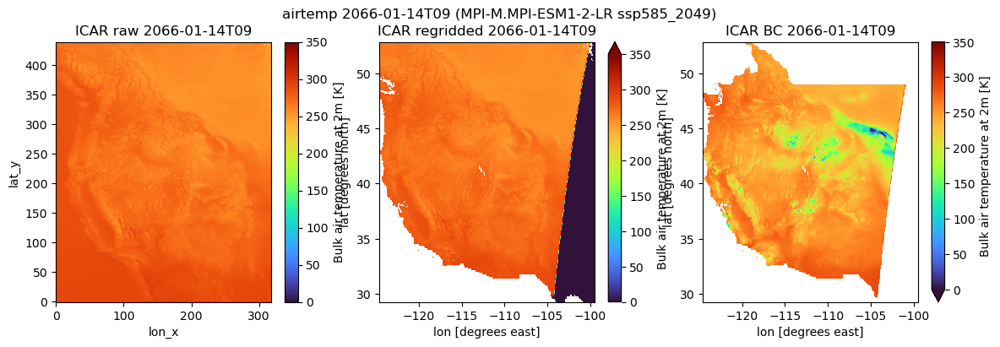

In [54]:
fig, ax =plt.subplots(1,3, figsize=(14,4))
vmin=0; vmax=350
t1 = "2066-01-14T09"
dspp.ta2m.sel(time=t1).plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[0])
dsin.ta2m.sel(time=t1).plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[1])
# dsout.ta2m.sel(time=t1).plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[2])
dsout2.ta2m.sel(time=t1).plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[2])

ax[0].set_title(f"ICAR raw {t1}")
ax[1].set_title(f"ICAR regridded {t1}")
ax[2].set_title(f"ICAR BC {t1}")
fig.suptitle(f"airtemp {t1} ({model} {scen})")

In [32]:
# np.where(dsout.lat.values>45)
np.where(dsout.lon.values>-105)

(array([314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326,
        327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339,
        340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352,
        353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365,
        366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378,
        379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391,
        392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402]),)

In [66]:
idx = np.where(dsout[var].values <100 )
idx

(array([  959,   959,   959, ..., 14555, 14556, 14559]),
 array([  7,   8,   9, ..., 155, 163, 163]),
 array([326, 326, 326, ..., 117,  81,  81]))

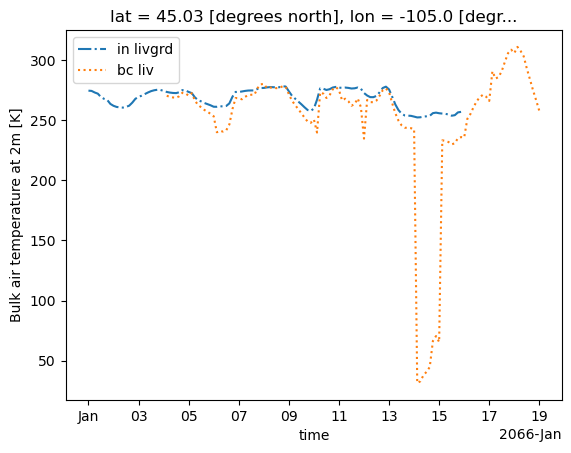

In [56]:
var='ta2m'
t0=(year-year5)*365*8 # roughly
t1=(year-1950)*365 # roughly
dt=120 ; a=252; b=314
# dsr[var][:dt,a,b].plot(label='raw')  # different grid
# dspp[var][:dt,a,b].plot(label='post processed')
dsin[var][:dt,a,b].plot(linestyle="-.",label='in livgrd')
dsout[var][t0:t0+dt,a,b].plot(linestyle=":",label='bc liv')
# dsout2[var][t1:t1+dt,a,b].plot(linestyle="--",label='bc liv2')
# livneht.Tmin[t1:t1+dt,a,b].plot(linestyle="-.",label='livneh')
plt.legend()
plt.show()

Text(0.5, 0.98, 'min airtemp 2066 (MPI-M.MPI-ESM1-2-LR ssp585_2049)')

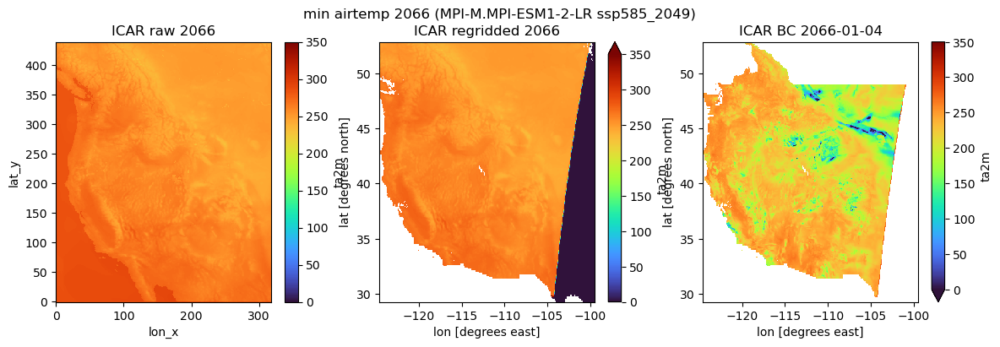

In [19]:
fig, ax =plt.subplots(1,3, figsize=(14,4))
vmin=0; vmax=350
dspp.ta2m.min(dim='time').plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[0])
dsin.ta2m.min(dim='time').plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[1])
# dsout.ta2m.isel(time=slice(t0,t0+365)).min(dim='time').plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[2])
dsout2.ta2m.isel(time=slice(t0,t0+365)).min(dim='time').plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[2])

ax[0].set_title(f"ICAR raw {str(year)}")
ax[1].set_title(f"ICAR regridded {str(year)}")
ax[2].set_title(f"ICAR BC {str(dsout.time[t0].values)[:10]}")
fig.suptitle(f"min airtemp {str(year)} ({model} {scen})")

<xarray.DataArray '__xarray_dataarray_variable__' (lat: 378, lon: 403)>
[152334 values with dtype=bool]
Coordinates:
  * lat      (lat) float64 29.28 29.34 29.41 29.47 ... 52.66 52.72 52.78 52.84
  * lon      (lon) float64 -124.6 -124.5 -124.5 -124.4 ... -99.59 -99.53 -99.47

In [63]:
dsref.ta2m.where(tmask.__xarray_dataarray_variable__).min(dim='time').plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[0])

Text(0.5, 0.98, 'min airtemp 2066 (MPI-M.MPI-ESM1-2-LR ssp585_2049)')

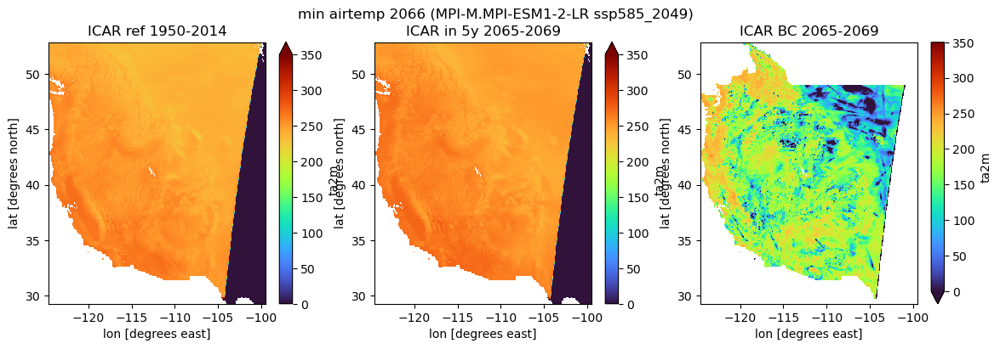

In [49]:
fig, ax =plt.subplots(1,3, figsize=(14,4))
vmin=0; vmax=350
dsref.ta2m.min(dim='time').plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[0])
dsin5y.ta2m.min(dim='time').plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[1])
# dsout.ta2m.isel(time=slice(t0,t0+365)).min(dim='time').plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[2])
dsout2.ta2m.min(dim='time').plot.pcolormesh(vmin=vmin, vmax=vmax, cmap='turbo', ax=ax[2])

ax[0].set_title(f"ICAR ref 1950-2014")
ax[1].set_title(f"ICAR in 5y {str(year5)}-{str(year5+4)}")
ax[2].set_title(f"ICAR BC {str(year5)}-{str(year5+4)}")
fig.suptitle(f"min airtemp {str(year)} ({model} {scen})")

### look at distributions:

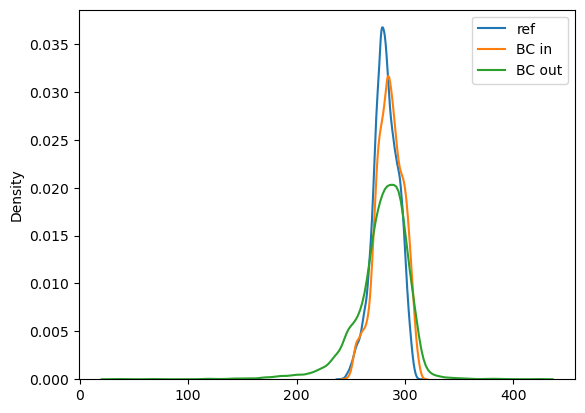

In [65]:

sns.kdeplot( dsref.ta2m.values[:,a,b] , label='ref')
sns.kdeplot( dsin5y.ta2m.values[:,a,b] , label='BC in')
sns.kdeplot( dsout.ta2m.values[:,a,b] , label='BC out')

plt.legend()
plt.show()

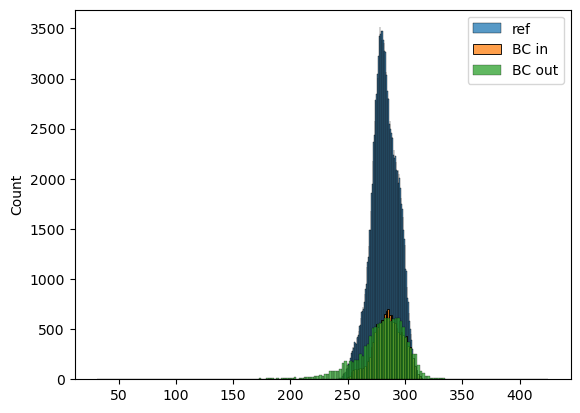

In [15]:
kde=False
a=252; b=314
sns.histplot( dsref.ta2m.values[:,a,b] , label='ref', kde=kde)
sns.histplot( dsin5y.ta2m.values[:,a,b] , label='BC in', kde=kde)
sns.histplot( dsout.ta2m.values[:,a,b] , label='BC out', kde=kde)

plt.legend()
plt.show()

### resample 2 daily 

In [12]:
a=252; b=314
dsref_Tmin = dsref.ta2m[:,a,b].resample(time='D').min().load()

In [13]:
dsin_Tmin  = dsin5y.ta2m[:,a,b].resample(time='D').min().load()

In [14]:
dsout_Tmin = dsout.ta2m[:,a,b].resample(time='D').min().load()

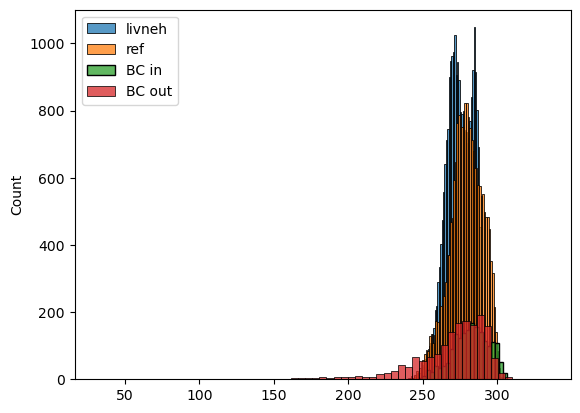

In [19]:

sns.histplot( livneht.Tmin[:,a,b]+273.5, label='livneh')
sns.histplot( dsref_Tmin , label='ref')
sns.histplot( dsin_Tmin , label='BC in')
sns.histplot( dsout_Tmin , label='BC out')

plt.legend()
plt.show()

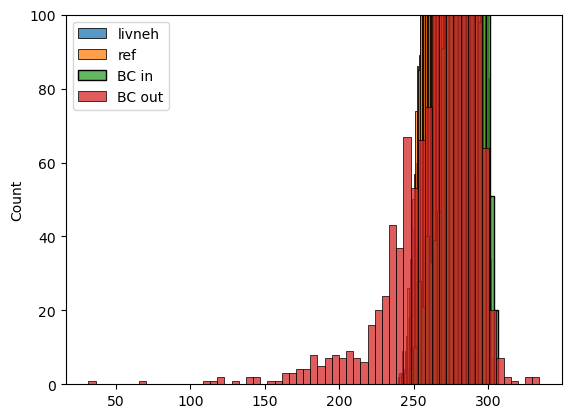

In [21]:

sns.histplot( livneht.Tmin[:,a,b]+273.5, label='livneh')
sns.histplot( dsref_Tmin , label='ref')
sns.histplot( dsin_Tmin , label='BC in')
sns.histplot( dsout_Tmin , label='BC out')

plt.ylim(None, 100)
plt.legend()
plt.show()

In [23]:
livneht.Tmin.attrs

{'units': 'degC', 'long_name': 'Minimum daily air temperature'}

In [ ]:
livneht.Tmin.min(dim='time').plot.pcolormesh(vmin=-70, vmax=30, cmap='turbo')

In [ ]:
livneht.Tmax.max(dim='time').plot.pcolormesh(vmin=0, vmax=70, cmap='turbo')

In [16]:
# # path="/global/cfs/cdirs/m4062/CMIP6/WUS/WUS_icar_livBC3"
# # model="MPI-M.MPI-ESM1-2-LR"
# # scen="ssp585"
# dsout=xr.open_dataset(
#     "/glade/campaign/ral/hap/bert/CMIP6/WUS_icar_livBC3/MPI-M.MPI-ESM1-2-LR_ssp585/3hr/icar_3hr_livgrid_MPI-M.MPI-ESM1-2-LR_ssp585_2065-2069.nc"
# )

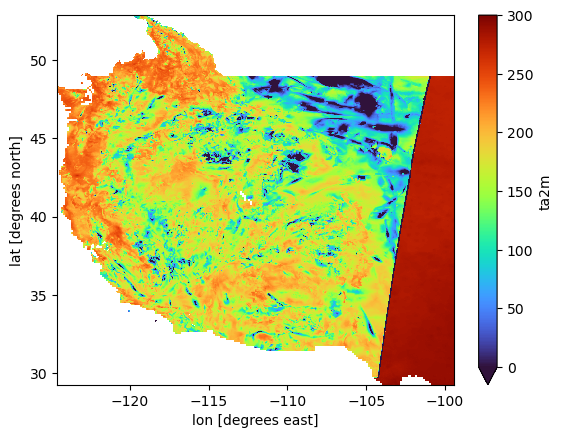

In [24]:
dsout.ta2m.min(dim='time').plot.pcolormesh(vmin=0, vmax=300, cmap='turbo')

In [21]:
# ds.ta2m.min(dim='time').plot.pcolormesh()

In [ ]:
path="/glade/campaign/ral/hap/bert/CMIP5/WUS_icar_livBC/CanESM2_historical/3hr"
files=sorted(glob.glob( f"{path}/*.nc"))
# files

In [5]:
ds=xr.open_dataset(files[0])
ds

<xarray.Dataset>
Dimensions:    (time: 14600, lat: 378, lon: 403)
Coordinates:
  * time       (time) object 1950-01-01 00:00:00 ... 1954-12-31 21:00:00
  * lat        (lat) float64 29.28 29.34 29.41 29.47 ... 52.66 52.72 52.78 52.84
  * lon        (lon) float64 -124.6 -124.5 -124.5 ... -99.59 -99.53 -99.47
Data variables:
    rsds       (time, lat, lon) float32 ...
    rlds       (time, lat, lon) float32 ...
    u10m       (time, lat, lon) float32 ...
    v10m       (time, lat, lon) float32 ...
    ta2m       (time, lat, lon) float32 ...
    psfc       (time, lat, lon) float32 ...
    precip_dt  (time, lat, lon) float32 ...
    relhum2m   (time, lat, lon) float32 ...
Attributes:
    regrid_method:  conservative

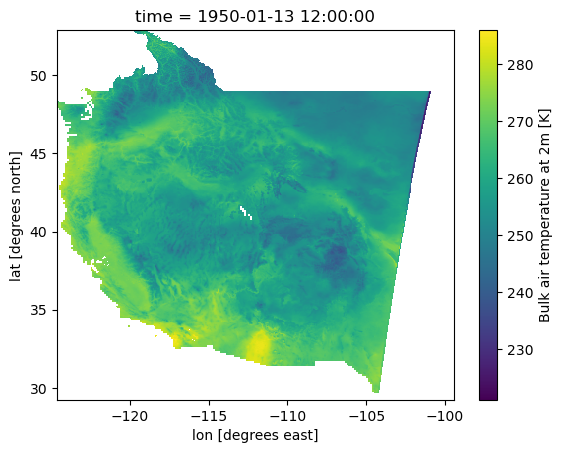

In [8]:
ds.ta2m.isel(time=100).plot()

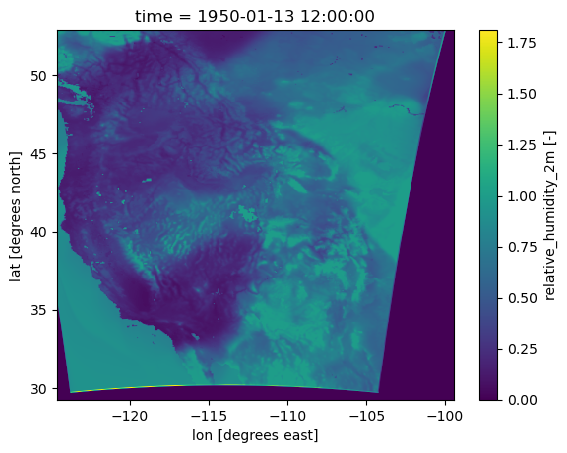

In [9]:
ds.relhum2m.isel(time=100).plot()